In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn import preprocessing

import umap.umap_ as umap
from sklearn.manifold import TSNE
import trimap
import pacmap

/Users/bartoszminch/miniconda3/envs/viskit/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [2]:
df_ball_1sphere = pd.read_csv('../data/ball_1sphere_10k.csv', header=None)
classes_ball_1sphere = np.array([i for i in range(2) for _ in range(5000)])

min_max_scaler = preprocessing.MinMaxScaler()
data_ball_1sphere_scaled = min_max_scaler.fit_transform(df_ball_1sphere)

data_ball_1sphere_scaled = pd.DataFrame(data=data_ball_1sphere_scaled)
data_ball_1sphere_scaled.to_csv('../data/ball_1sphere_10k_scaled.csv', header=False, index=False)
data_ball_1sphere_scaled.head(15)

df_classes_ball_1sphere = pd.DataFrame(classes_ball_1sphere)
df_classes_ball_1sphere.to_csv('../data/ball_1sphere_10k_scaled_labels.csv', header=False, index=False)

In [3]:
def plot_2d_scatter(X, y, c):
    fig, plot = plt.subplots()
    fig.set_size_inches(16, 16)

    for i in range(c):
        digit_indices = (y == i)

        dim1 = X[digit_indices, 0]
        dim2 = X[digit_indices, 1]
        plot.scatter(dim1, dim2, label=f"'{i}'")

    plot.set_xticks(())
    plot.set_yticks(())

    plt.tight_layout()
    plt.legend()
    plt.show()

t-SNE

In [4]:
ball_1sphere_tsne_p40 = TSNE(n_components=2, init="pca", learning_rate='auto', perplexity=40)
ball_1sphere_tsne_p120 = TSNE(n_components=2, init="pca", learning_rate='auto', perplexity=120)
ball_1sphere_tsne_p200 = TSNE(n_components=2, init="pca", learning_rate='auto', perplexity=200)

ball_1sphere_x_40_tsne = ball_1sphere_tsne_p40.fit_transform(data_ball_1sphere_scaled)
ball_1sphere_x_120_tsne = ball_1sphere_tsne_p120.fit_transform(data_ball_1sphere_scaled)
ball_1sphere_x_200_tsne = ball_1sphere_tsne_p200.fit_transform(data_ball_1sphere_scaled)

/Users/bartoszminch/miniconda3/envs/viskit/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
/Users/bartoszminch/miniconda3/envs/viskit/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
/Users/bartoszminch/miniconda3/envs/viskit/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


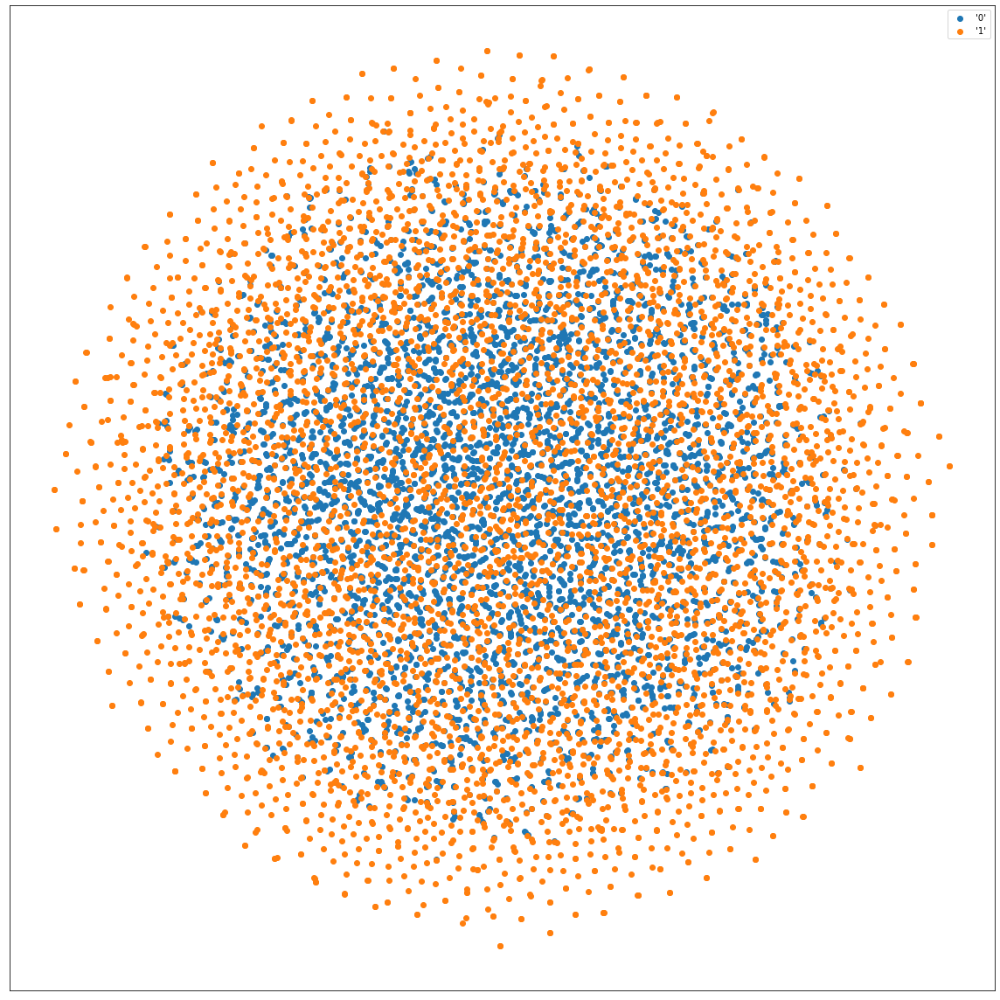

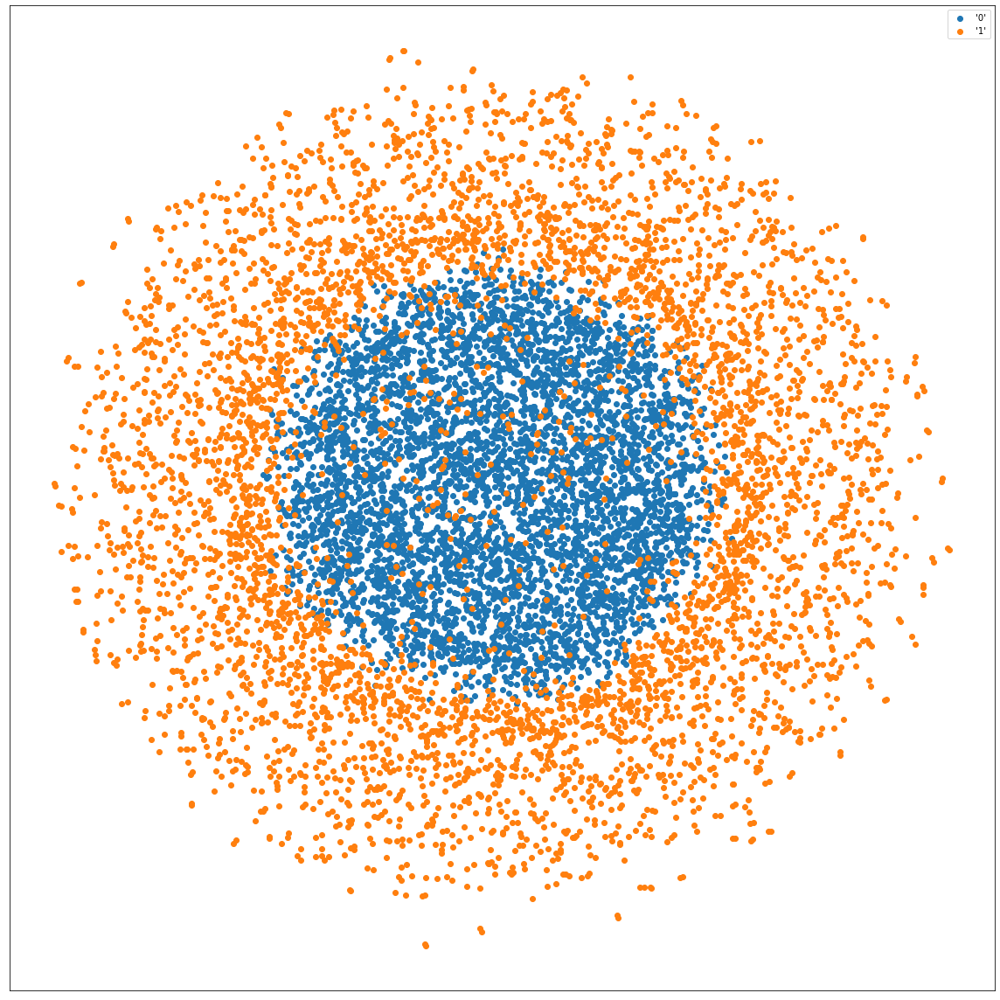

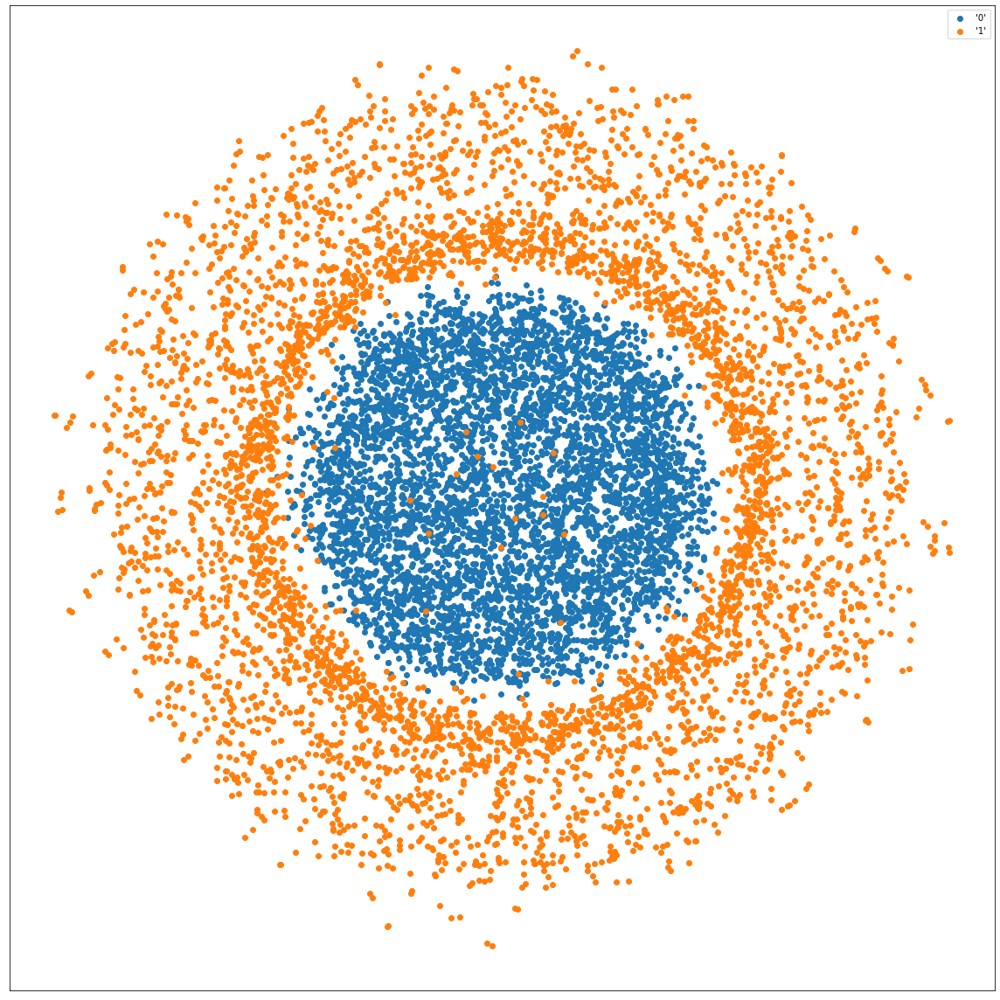

In [5]:
plot_2d_scatter(ball_1sphere_x_40_tsne, classes_ball_1sphere, 2)
plot_2d_scatter(ball_1sphere_x_120_tsne, classes_ball_1sphere, 2)
plot_2d_scatter(ball_1sphere_x_200_tsne, classes_ball_1sphere, 2)

UMAP

In [6]:
ball_1sphere_umap_nn10 = umap.UMAP(n_neighbors=10)
ball_1sphere_umap_nn20 = umap.UMAP(n_neighbors=20)
ball_1sphere_umap_nn50 = umap.UMAP(n_neighbors=50)

ball_1sphere_x_10_umap = ball_1sphere_umap_nn10.fit_transform(data_ball_1sphere_scaled)
ball_1sphere_x_20_umap = ball_1sphere_umap_nn20.fit_transform(data_ball_1sphere_scaled)
ball_1sphere_x_50_umap = ball_1sphere_umap_nn50.fit_transform(data_ball_1sphere_scaled)

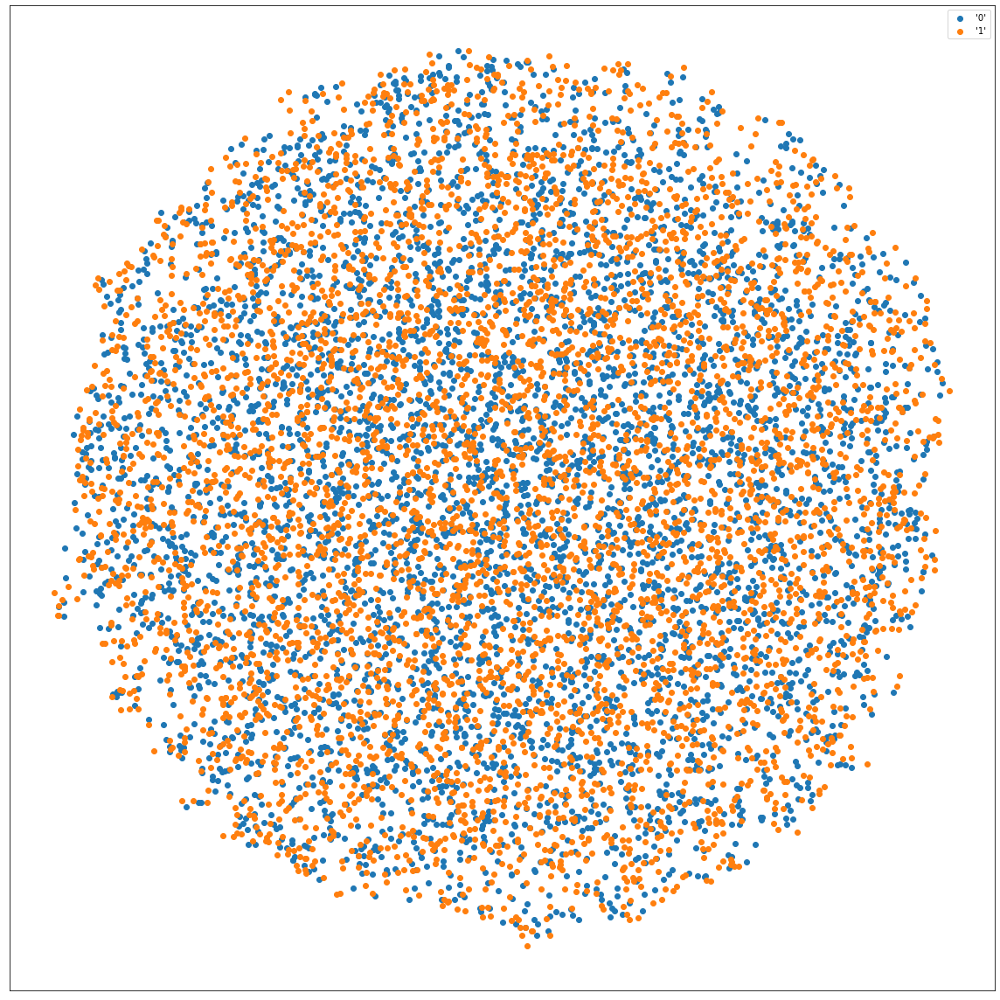

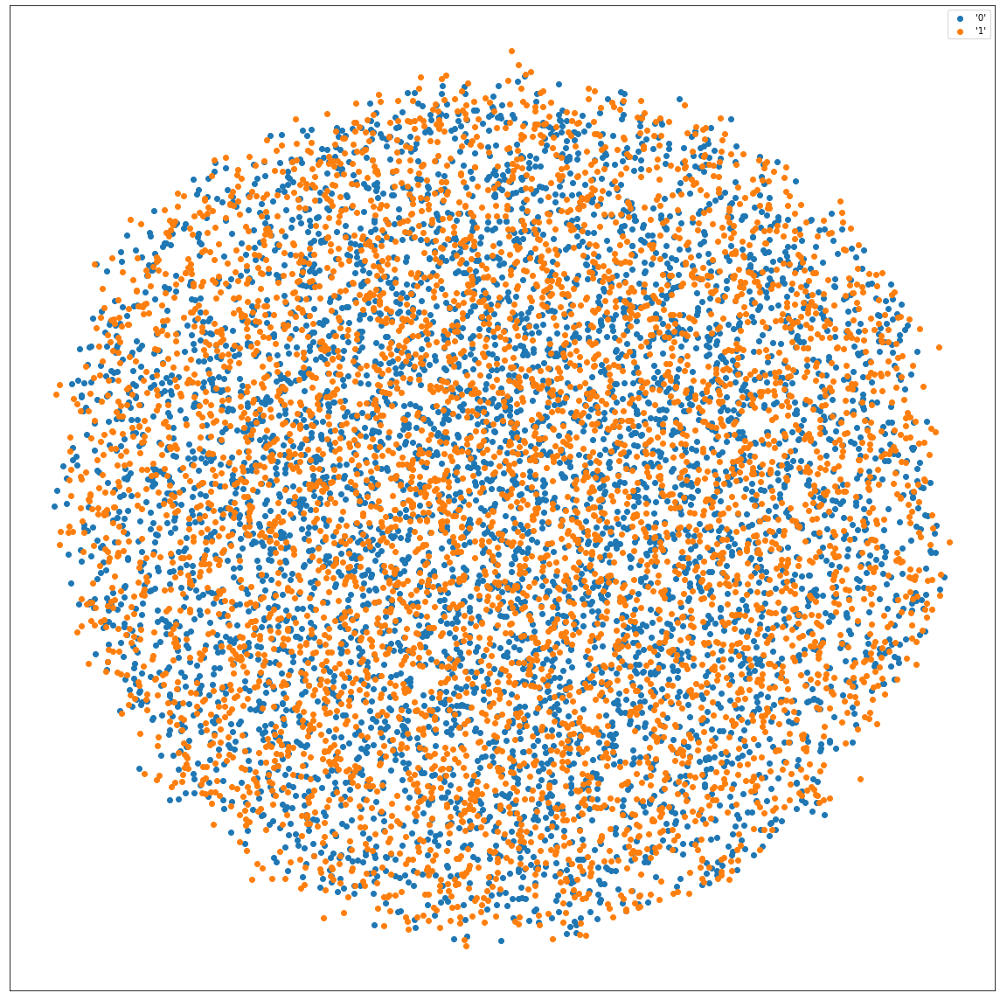

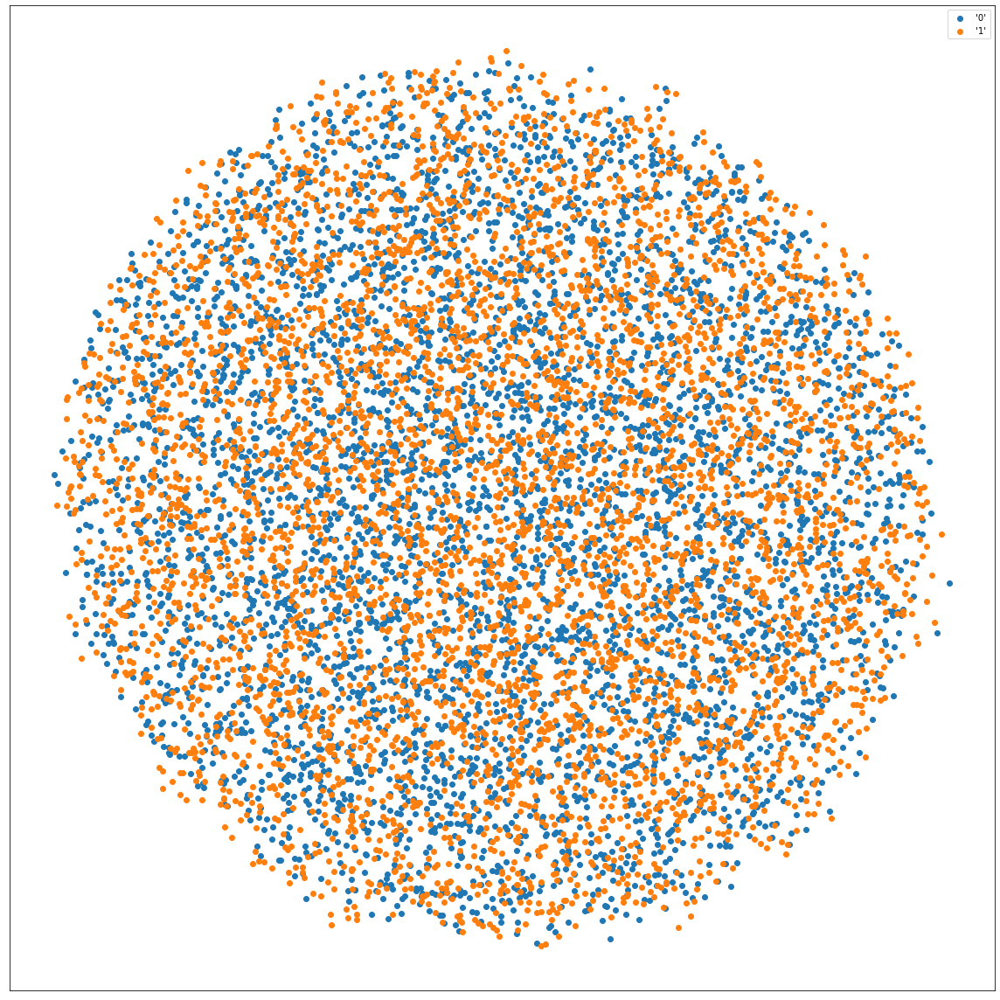

In [7]:
plot_2d_scatter(ball_1sphere_x_10_umap, classes_ball_1sphere, 2)
plot_2d_scatter(ball_1sphere_x_20_umap, classes_ball_1sphere, 2)
plot_2d_scatter(ball_1sphere_x_50_umap, classes_ball_1sphere, 2)

TriMAP

In [8]:
data_ball_1sphere_scaled = min_max_scaler.fit_transform(df_ball_1sphere)

ball_1sphere_trimap_ni10 = trimap.TRIMAP(n_inliers=10,
                            n_outliers=5,
                            n_random=5)
ball_1sphere_trimap_ni20 = trimap.TRIMAP(n_inliers=20,
                            n_outliers=5,
                            n_random=5)
ball_1sphere_trimap_ni40 = trimap.TRIMAP(n_inliers=40,
                            n_outliers=5,
                            n_random=5)

ball_1sphere_x_10_trimap = ball_1sphere_trimap_ni10.fit_transform(data_ball_1sphere_scaled)
ball_1sphere_x_20_trimap = ball_1sphere_trimap_ni20.fit_transform(data_ball_1sphere_scaled)
ball_1sphere_x_40_trimap = ball_1sphere_trimap_ni40.fit_transform(data_ball_1sphere_scaled)

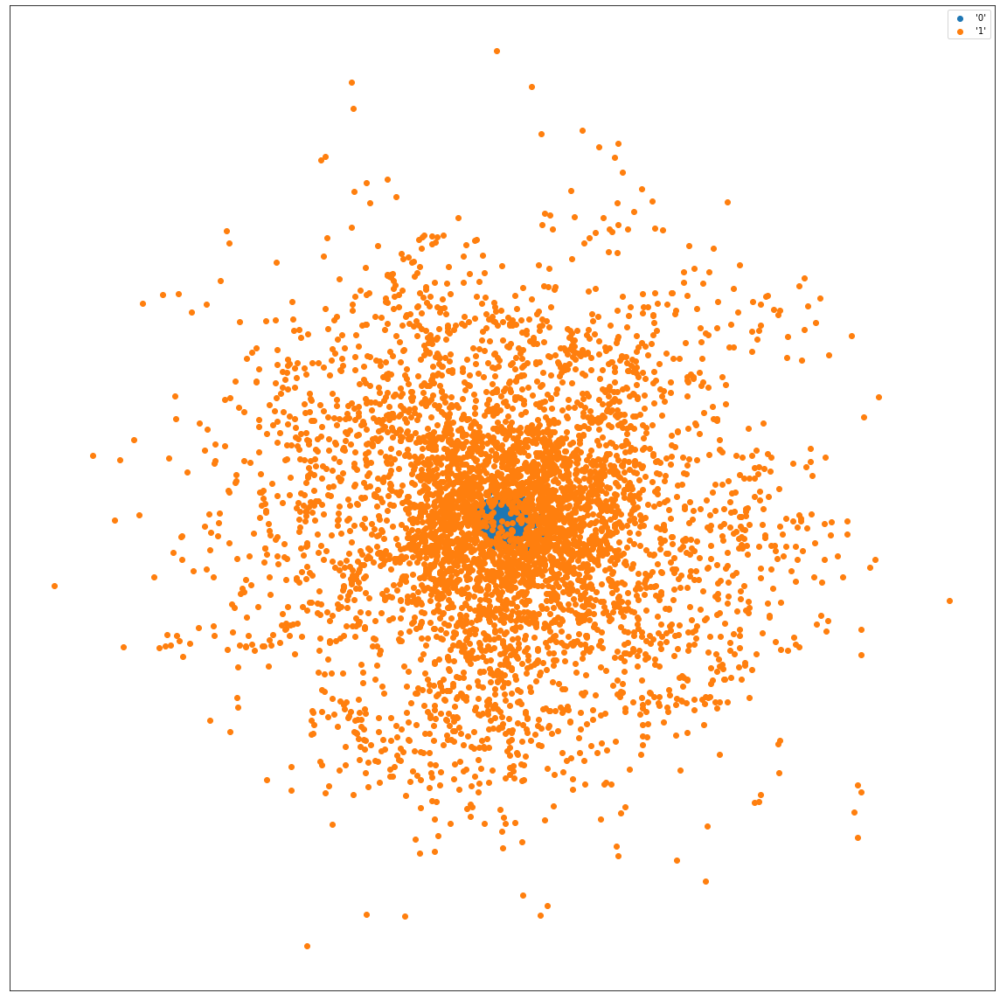

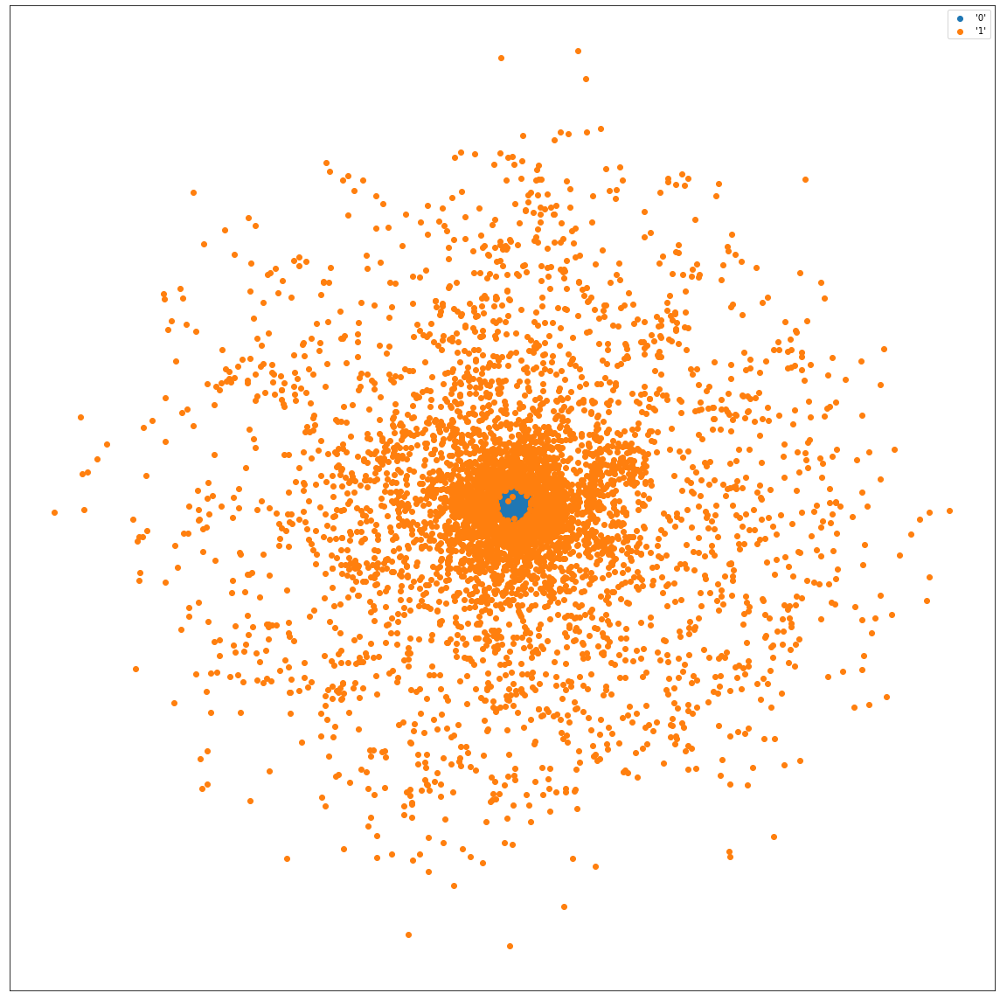

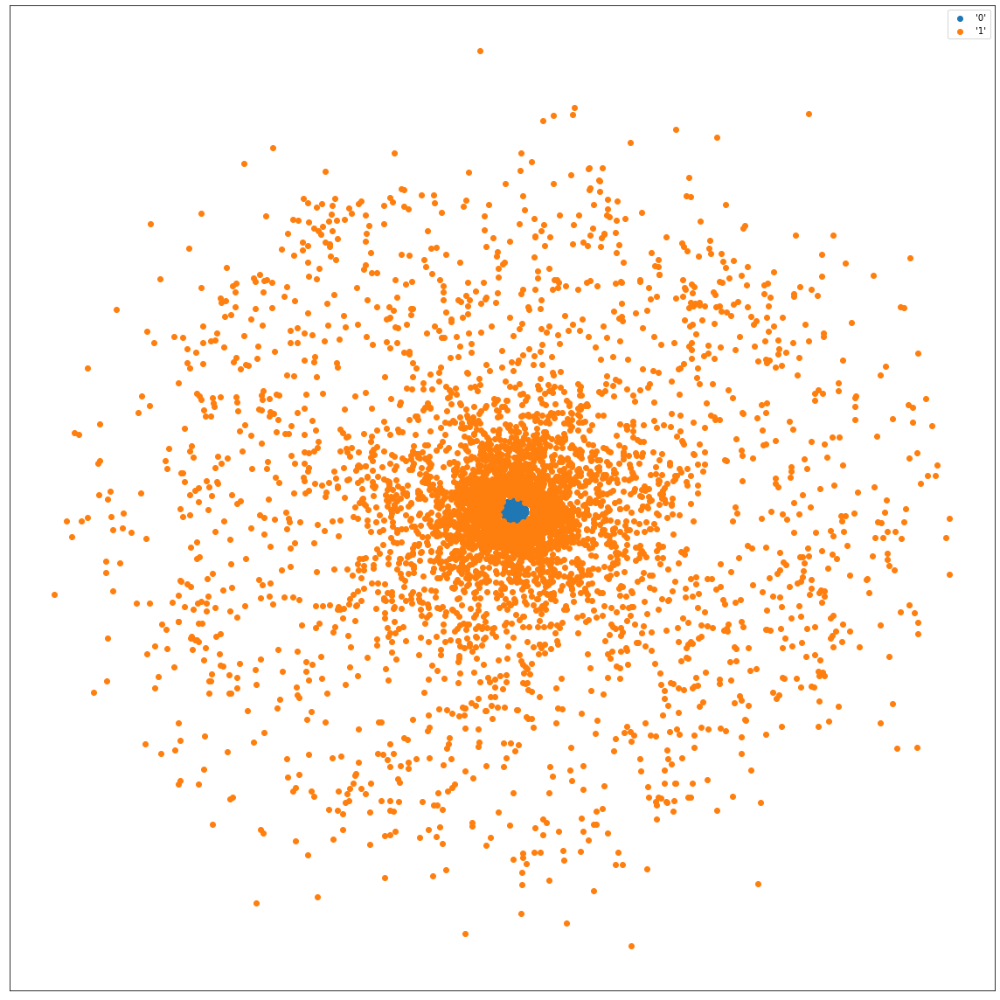

In [9]:
plot_2d_scatter(ball_1sphere_x_10_trimap, classes_ball_1sphere, 2)
plot_2d_scatter(ball_1sphere_x_20_trimap, classes_ball_1sphere, 2)
plot_2d_scatter(ball_1sphere_x_40_trimap, classes_ball_1sphere, 2)

PaCMAP

In [10]:
ball_1sphere_pacmap = pacmap.PaCMAP(n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0)
ball_1sphere_pacmap_nn10 = pacmap.PaCMAP(n_neighbors=10, MN_ratio=0.5, FP_ratio=2.0)
ball_1sphere_pacmap_nn20 = pacmap.PaCMAP(n_neighbors=20, MN_ratio=0.5, FP_ratio=2.0)

ball_1sphere_x_pacmap = ball_1sphere_pacmap.fit_transform(data_ball_1sphere_scaled, init="pca")
ball_1sphere_x_nn10_pacmap = ball_1sphere_pacmap_nn10.fit_transform(data_ball_1sphere_scaled, init="pca")
ball_1sphere_x_nn20_pacmap = ball_1sphere_pacmap_nn20.fit_transform(data_ball_1sphere_scaled, init="pca")

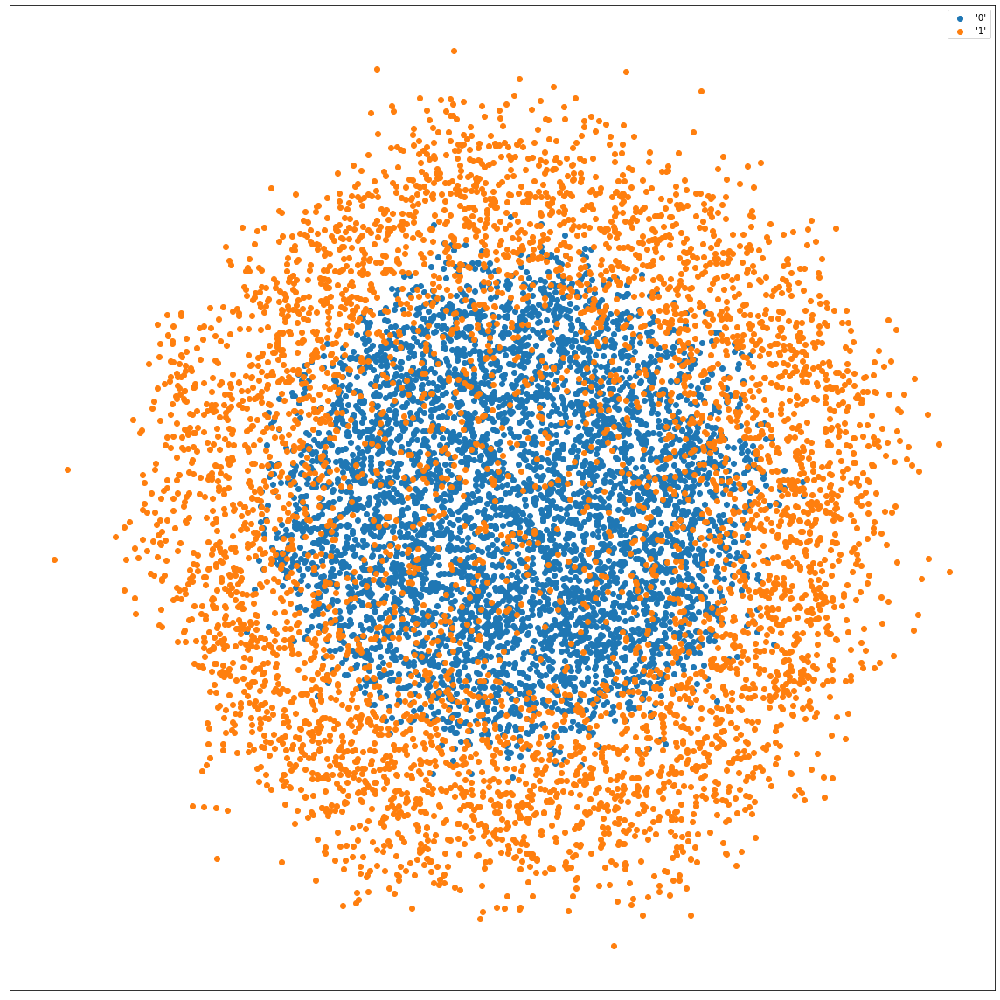

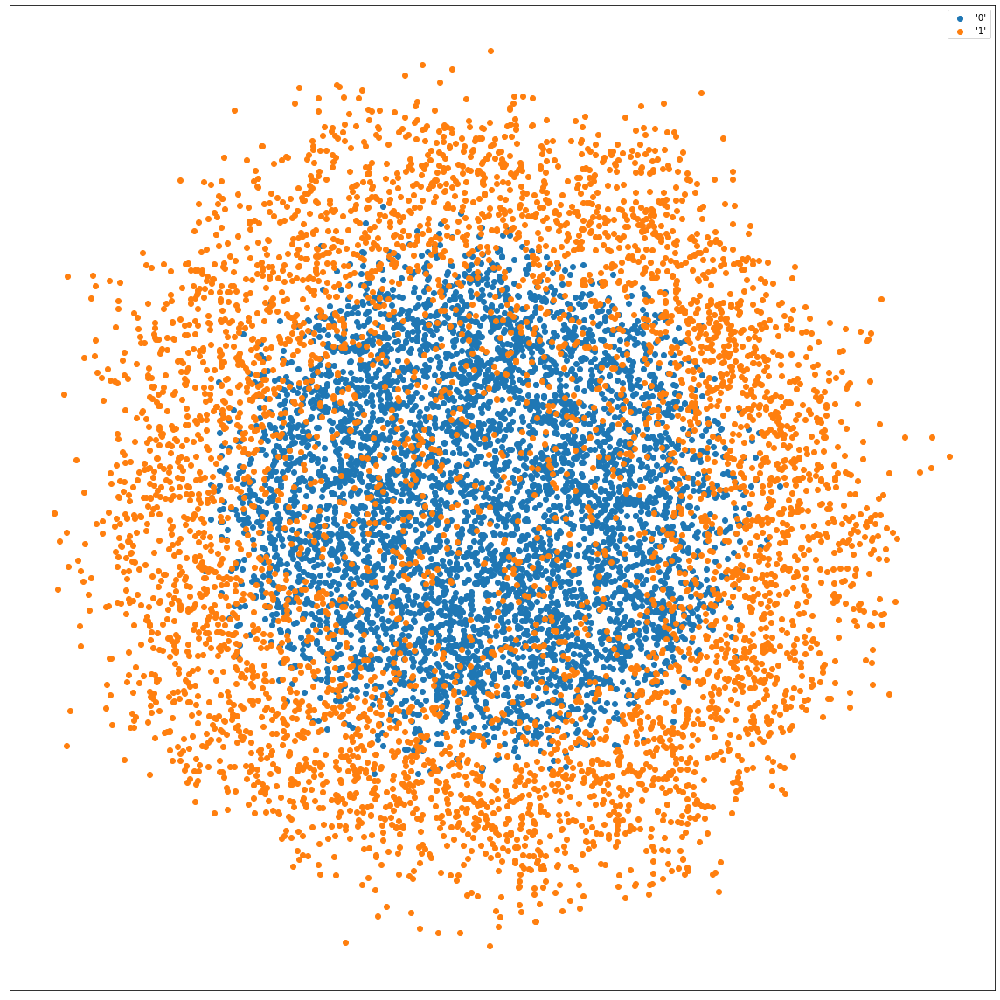

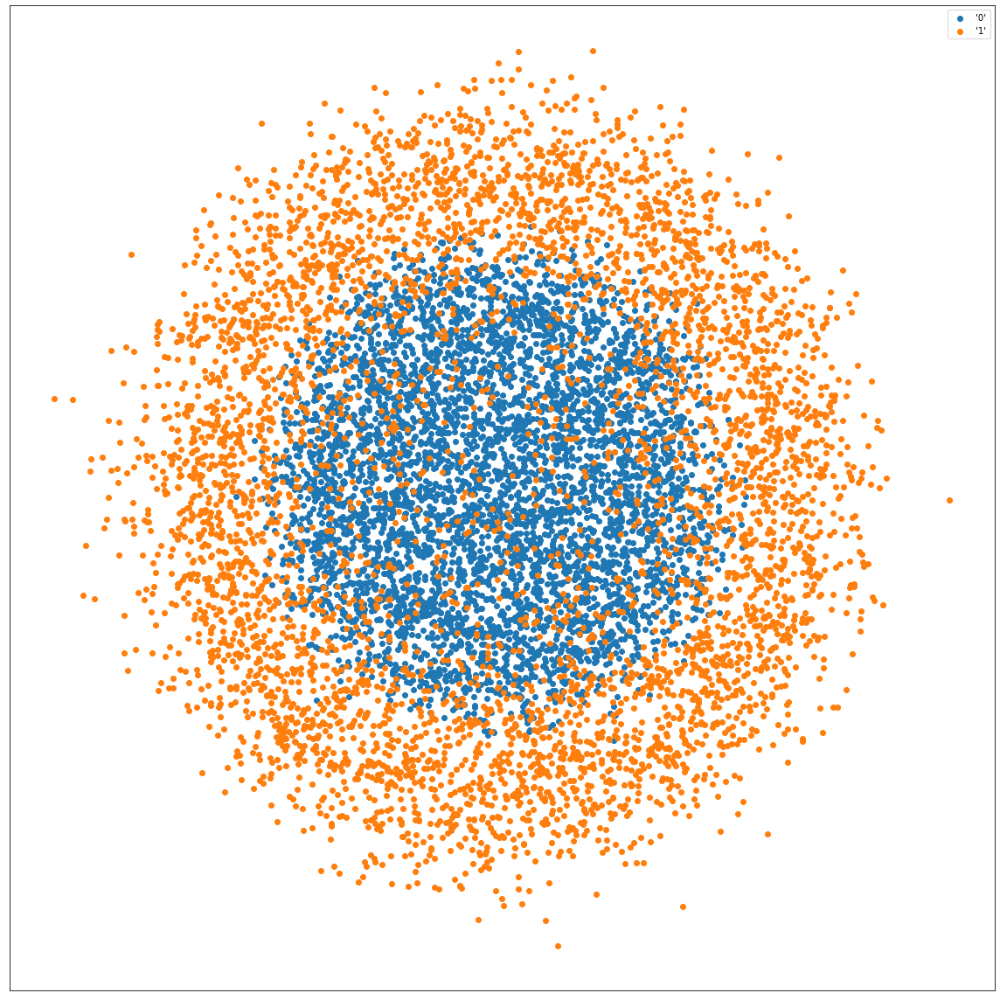

In [11]:
plot_2d_scatter(ball_1sphere_x_pacmap, classes_ball_1sphere, 2)
plot_2d_scatter(ball_1sphere_x_nn10_pacmap, classes_ball_1sphere, 2)
plot_2d_scatter(ball_1sphere_x_nn20_pacmap, classes_ball_1sphere, 2)

IVHD

In [12]:
ball_1sphere_ivhd_const_args = {
    'dir': "../viskit_offline",
    'labels_csv': "../data/ball_1sphere_10k_scaled_labels.csv",
    'output': "../data/ball_1sphere_10k.txt",
    'iter': 2500,
    'bd': 1, # binaryDistances
    'rns': 0, # reverseNeighborsSteps
    'rnc': 0, # reverseNeighborsCount
    'l1s': 0, # l1Steps
    'optimizer': "force-directed"
}

ball_1sphere_ivhd_args = [
    {'data_csv': "../data/ball_1sphere_10k_scaled.csv", 'gp': "../data/ball_1sphere_10k_scaled_euclidean.bin", 'nn': 3, 'rn': 1},
    {'data_csv': "../data/ball_1sphere_10k_scaled.csv", 'gp': "../data/ball_1sphere_10k_scaled_euclidean.bin", 'nn': 5, 'rn': 1},
    {'data_csv': "../data/ball_1sphere_10k_scaled.csv", 'gp': "../data/ball_1sphere_10k_scaled_euclidean.bin", 'nn': 7, 'rn': 1},
    # {'data_csv': "./data/ball_1sphere_10k_scaled.csv", 'gp': "./data/ball_1sphere_10k_scaled_cosine.bin", 'nn': 3, 'rn': 1},
    # {'data_csv': "./data/ball_1sphere_10k_scaled.csv", 'gp': "./data/ball_1sphere_10k_scaled_cosine.bin", 'nn': 5, 'rn': 1},
    # {'data_csv': "./data/ball_1sphere_10k_scaled.csv", 'gp': "./data/ball_1sphere_10k_scaled_cosine.bin", 'nn': 7, 'rn': 1},
]

ball_1sphere_ivhd_names = [
    "IVHD scaled euclidean 3nn",
    "IVHD scaled euclidean 5nn",
    "IVHD scaled euclidean 7nn",
    # "IVHD scaled cosine 3nn",
    # "IVHD scaled cosine 5nn",
    # "IVHD scaled cosine 7nn",
]

def get_ivhd_result(output_file):
    df_ivhd = pd.read_csv(output_file, header=None)
    x_ivhd = df_ivhd.loc[:, '0':'1'].values
    return x_ivhd

import os

ball_1sphere_ivhd_results = []

for args in ball_1sphere_ivhd_args:
    csv_arg = args['data_csv']
    gp_arg = args['gp']
    nn_arg = args['nn']
    rn_arg = args['rn']

    command = '{dir} "{data_csv}" "{labels_csv}" "{gp}" {output} {iter} {nn} {rn} {bd} {rns} {rnc} {l1s} "{optimizer}"'.format(
        dir = ball_1sphere_ivhd_const_args['dir'],
        data_csv = csv_arg,
        labels_csv = ball_1sphere_ivhd_const_args['labels_csv'],
        gp = gp_arg,
        output = ball_1sphere_ivhd_const_args['output'],
        iter = ball_1sphere_ivhd_const_args['iter'],
        nn = nn_arg,
        rn = rn_arg,
        bd = ball_1sphere_ivhd_const_args['bd'],
        rns = ball_1sphere_ivhd_const_args['rns'],
        rnc = ball_1sphere_ivhd_const_args['rnc'],
        l1s = ball_1sphere_ivhd_const_args['l1s'],
        optimizer = ball_1sphere_ivhd_const_args['optimizer'],
    )

    os.system(command)
    res = get_ivhd_result(ball_1sphere_ivhd_const_args['output'])
    res = np.flip(res, axis=0)
    ball_1sphere_ivhd_results.append(res)

[Info] [CSV Parser] Loading dataset from file: ./data/ball_1sphere_10k_scaled.csv
[Info] [CSV Parser] Loading labels from file: ./data/ball_1sphere_10k_scaled_labels.csv
[Info] [CSV Parser] Labels file passed.
[Info] [CSV Parser] Dataset size: 10000
[Info] [CSV Parser] Dataset dimensionality: 30
[Info] [CSV Parser] Number of classes in dataset: 2
[Info] [CSV Parser] Finished.
[Info] [Graph] Loading graph from cache...
[Info] [Graph] Using binary distances...
[Info] [Graph] Finished.
[Info] [kNN Generator] Determining random neighbors...
[Info] [kNN Generator] Finished.
[Info] [kNN Generator] Neighbors in graph: 40000
[Info] [CSV Parser] Loading dataset from file: ./data/ball_1sphere_10k_scaled.csv
[Info] [CSV Parser] Loading labels from file: ./data/ball_1sphere_10k_scaled_labels.csv
[Info] [CSV Parser] Labels file passed.
[Info] [CSV Parser] Dataset size: 10000
[Info] [CSV Parser] Dataset dimensionality: 30
[Info] [CSV Parser] Number of classes in dataset: 2
[Info] [CSV Parser] Finish

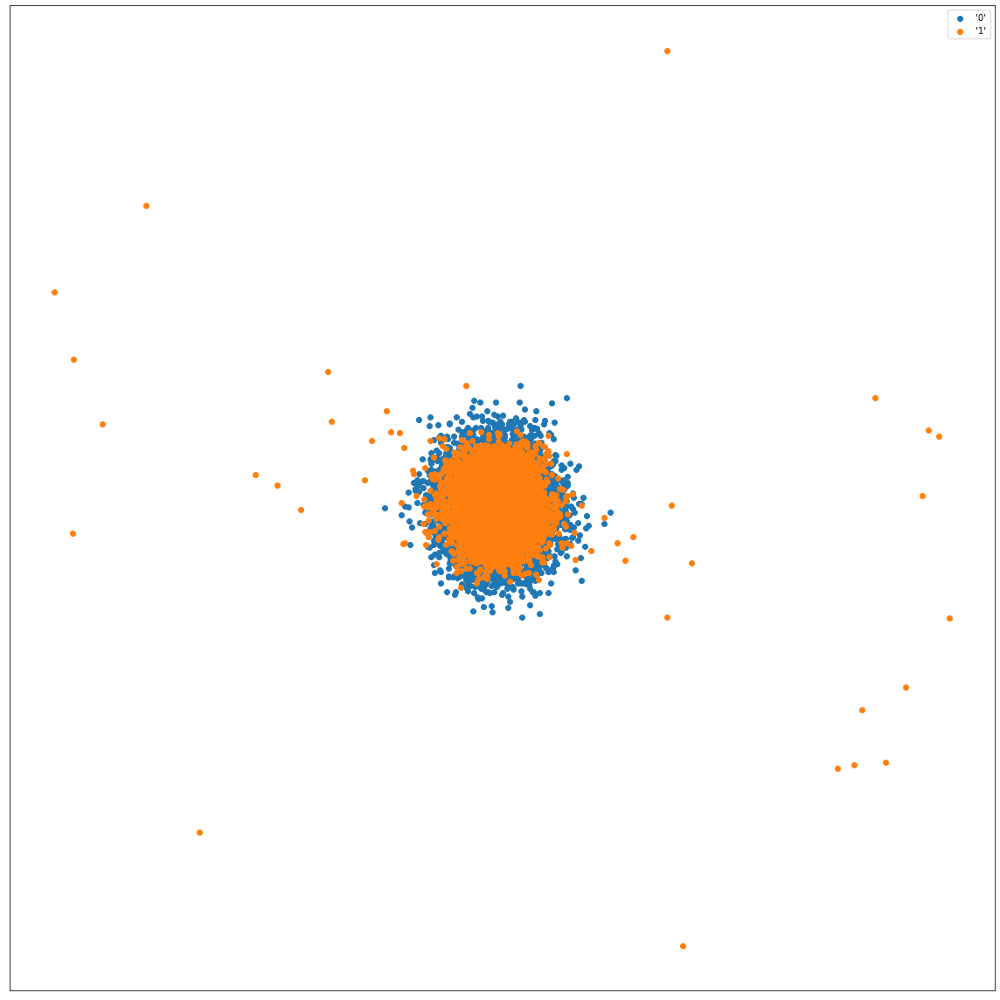

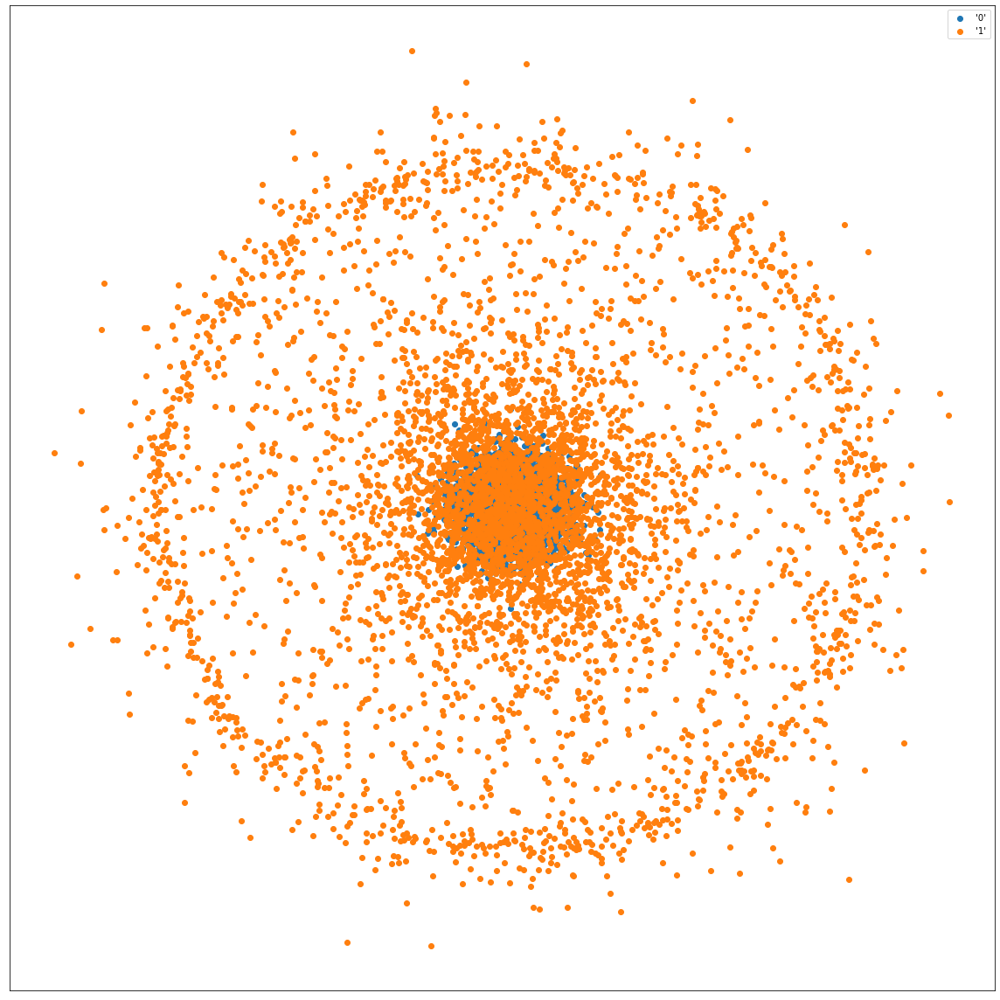

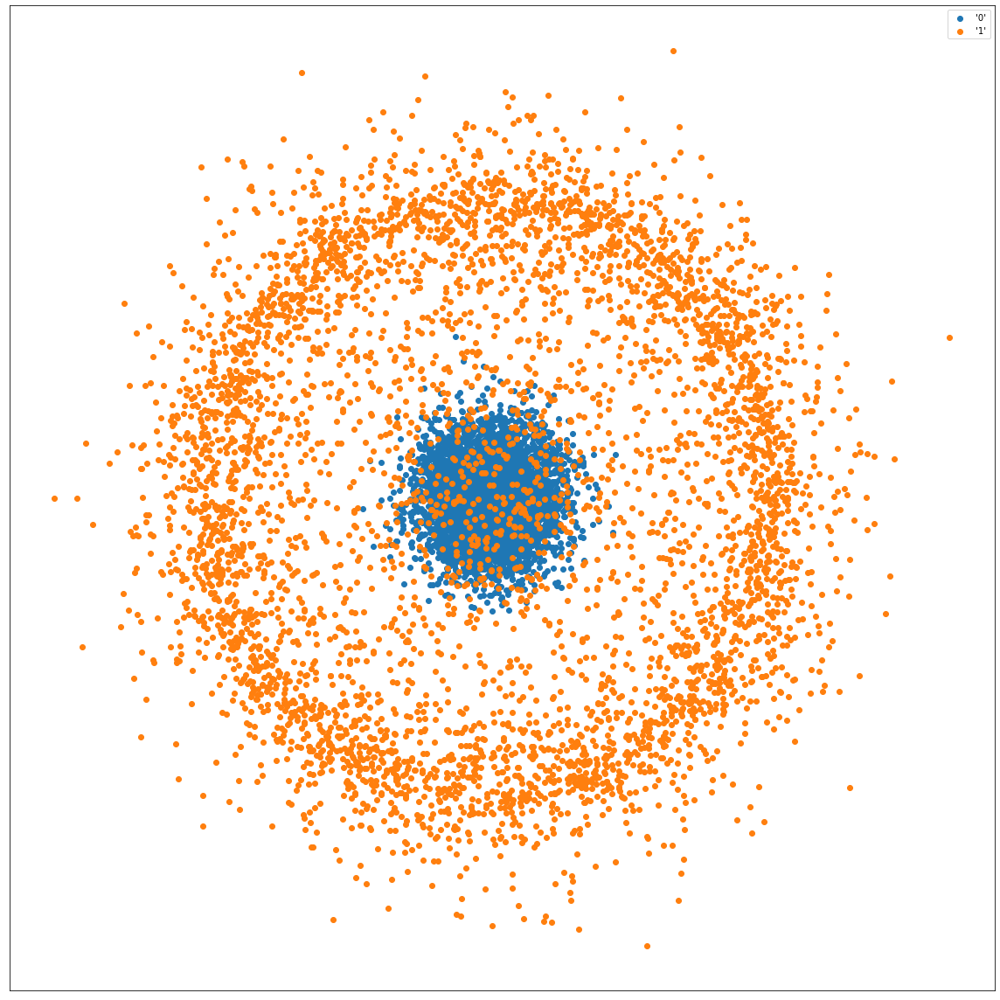

In [13]:
for x in ball_1sphere_ivhd_results:
    plot_2d_scatter(x, classes_ball_1sphere, 2)

### LargeVis

In [14]:
largevis_const_args = {
    'dir': "../viskit_offline",
    'dataset_csv': "../data/ball_1sphere_10k_scaled.csv",
    'labels_csv': "../data/ball_1sphere_10k_scaled_labels.csv",
    'output': "../data/emnist_letters_pca_100.txt",
    'iter': 1,
    'bd': 1, # binaryDistances
    'rns': 0, # reverseNeighborsSteps
    'rnc': 0, # reverseNeighborsCount
    'l1s': 0, # l1Steps
    'optimizer': "largevis"
}

largevis_args = [
    {'gp': "../data/ball_1sphere_10k_scaled_euclidean.bin", 'nn': 3, 'rn': 1},
    {'gp': "../data/ball_1sphere_10k_scaled_euclidean.bin", 'nn': 10, 'rn': 1},
    {'gp': "../data/ball_1sphere_10k_scaled_euclidean.bin", 'nn': 30, 'rn': 1},
]

largevis_names = [
    "LargeVis 3nn",
    "LargeVis 10nn",
    "LargeVis 30nn",
]

def get_largevis_result(output_file) -> pd.DataFrame:
    df_ivhd = pd.read_csv(output_file, header=None)
    x_ivhd = df_ivhd.loc[:, '0':'1'].values
    return x_ivhd

import os

largevis_results = []

i = 0
for args in largevis_args:
    gp_arg = args['gp']
    nn_arg = args['nn']
    rn_arg = args['rn']

    command = '{dir} "{data_csv}" "{labels_csv}" "{gp}" {output} {iter} {nn} {rn} {bd} {rns} {rnc} {l1s} "{optimizer}"'.format(
        dir = largevis_const_args['dir'],
        data_csv = largevis_const_args['dataset_csv'],
        labels_csv = largevis_const_args['labels_csv'],
        gp = gp_arg,
        output = largevis_const_args['output'],
        iter = largevis_const_args['iter'],
        nn = nn_arg,
        rn = rn_arg,
        bd = largevis_const_args['bd'],
        rns = largevis_const_args['rns'],
        rnc = largevis_const_args['rnc'],
        l1s = largevis_const_args['l1s'],
        optimizer = largevis_const_args['optimizer'],
    )

    os.system(command)
    res = get_largevis_result(largevis_const_args['output'])
    largevis_results.append(res)
    i += 1

[Info] [CSV Parser] Loading dataset from file: ./data/ball_1sphere_10k_scaled.csv
[Info] [CSV Parser] Loading labels from file: ./data/ball_1sphere_10k_scaled_labels.csv
[Info] [CSV Parser] Labels file passed.
[Info] [CSV Parser] Dataset size: 10000
[Info] [CSV Parser] Dataset dimensionality: 30
[Info] [CSV Parser] Number of classes in dataset: 2
[Info] [CSV Parser] Finished.
[Info] [Graph] Loading graph from cache...
[Info] [Graph] Using binary distances...
[Info] [Graph] Finished.
[Info] [kNN Generator] Determining random neighbors...
[Info] [kNN Generator] Finished.
[Info] [kNN Generator] Neighbors in graph: 40000
[Info] init done
Fitting model	Alpha: 0.9997 Progress: 0.03
Fitting model	Alpha: 0.9994 Progress: 0.06
Fitting model	Alpha: 0.9991 Progress: 0.09
Fitting model	Alpha: 0.9988 Progress: 0.12
Fitting model	Alpha: 0.9985 Progress: 0.15
Fitting model	Alpha: 0.9982 Progress: 0.18
Fitting model	Alpha: 0.9979 Progress: 0.21
Fitting model	Alpha: 0.9976 Progress: 0.24
Fitting model	

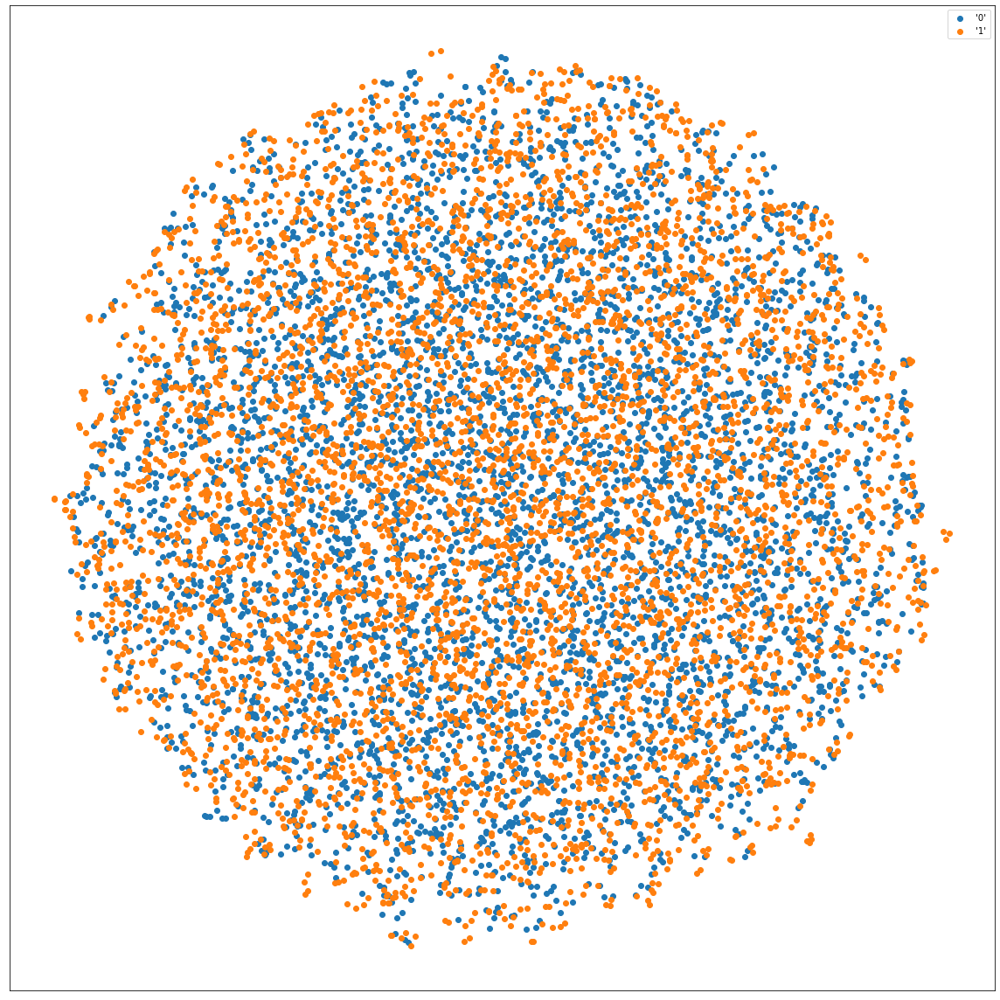

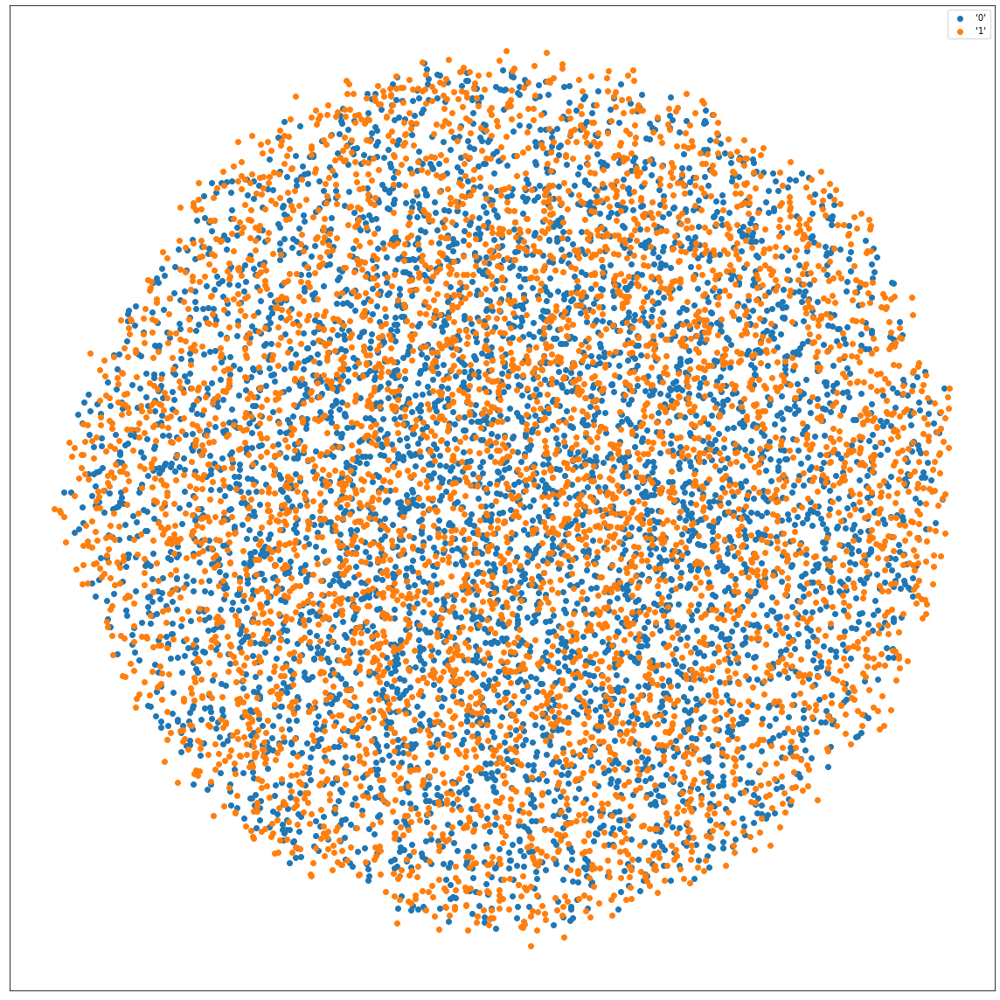

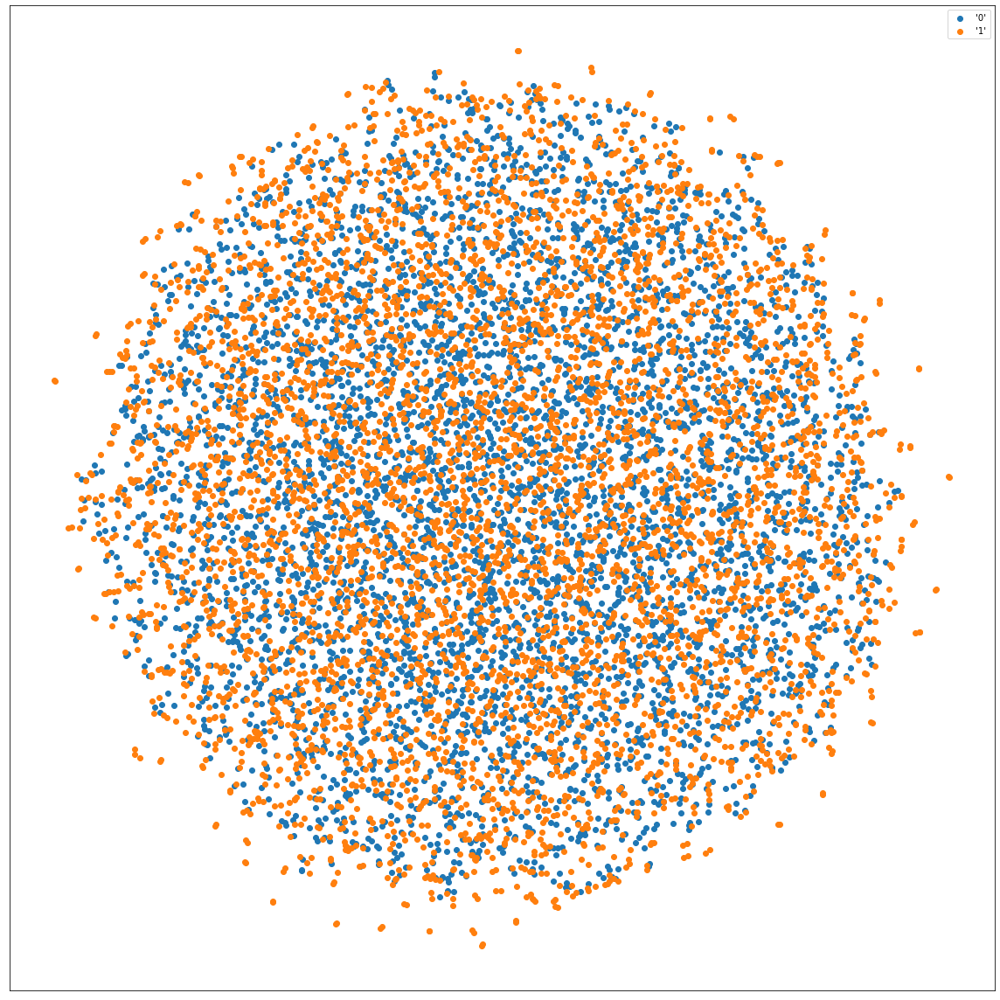

In [24]:
for x in largevis_results:
    plot_2d_scatter(x, classes_ball_1sphere, 2)

Comparison for 1 ball inside sphere

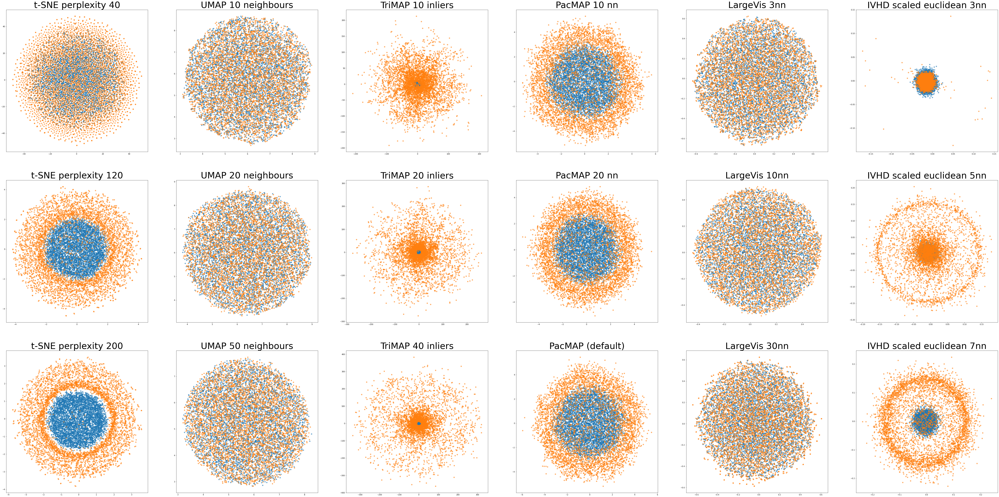

In [35]:
figure, axis = plt.subplots(3, 6)
figure.set_size_inches(100,50)
ball_2c_methods_names = [
    ["t-SNE perplexity 40", "t-SNE perplexity 120", "t-SNE perplexity 200"],
    ["UMAP 10 neighbours", "UMAP 20 neighbours", "UMAP 50 neighbours"],
    ["TriMAP 10 inliers", "TriMAP 20 inliers", "TriMAP 40 inliers"],
    ["PacMAP 10 nn", "PacMAP 20 nn", "PacMAP (default)"],
    [largevis_names[0], largevis_names[1], largevis_names[2]],
    [ball_1sphere_ivhd_names[0], ball_1sphere_ivhd_names[1], ball_1sphere_ivhd_names[2]],
]
todo_res = np.array([])
ball_2c_methods_results = [
    [ball_1sphere_x_40_tsne, ball_1sphere_x_120_tsne, ball_1sphere_x_200_tsne],
    [ball_1sphere_x_10_umap, ball_1sphere_x_20_umap, ball_1sphere_x_50_umap],
    [ball_1sphere_x_10_trimap, ball_1sphere_x_20_trimap, ball_1sphere_x_40_trimap],
    [ball_1sphere_x_nn10_pacmap, ball_1sphere_x_nn20_pacmap, ball_1sphere_x_pacmap],
    [largevis_results[0], largevis_results[1], largevis_results[2]],
    [ball_1sphere_ivhd_results[0], ball_1sphere_ivhd_results[1], ball_1sphere_ivhd_results[2]],
]

for j in range(6):
    for i in range(3):
        axis[i, j].set_title(ball_2c_methods_names[j][i], fontsize=50)

        X = ball_2c_methods_results[j][i]
        if not X.any():
            break

        for k in range(2):
            digit_indices = (classes_ball_1sphere == k)
            dim1 = X[digit_indices, 0]
            dim2 = X[digit_indices, 1]
            axis[i, j].scatter(dim1, dim2, label=f"'{i}'", alpha=0.6)

plt.show()

### Metrics

In [26]:
import numba
import random
from scipy.spatial.distance import squareform, pdist
from sklearn.model_selection import train_test_split

In [27]:
markers = ["x", "o", "s", "*", "^", ".", "X"]
colors = ["red", "blue", "green", "brown", "orange", "cyan", "grey", "purple"]


@numba.jit(nopython=True)
def knngain(d_hd, d_ld, labels):
    # Number of data points
    N = d_hd.shape[0]
    N_1 = N - 1
    k_hd = np.zeros(shape=N_1, dtype=np.int64)
    k_ld = np.zeros(shape=N_1, dtype=np.int64)
    # For each data point
    for i in range(N):
        c_i = labels[i]
        di_hd = d_hd[i, :].argsort(kind="mergesort")
        di_ld = d_ld[i, :].argsort(kind="mergesort")
        # Making sure that i is first in di_hd and di_ld
        for arr in [di_hd, di_ld]:
            for idj, j in enumerate(arr):
                if j == i:
                    idi = idj
                    break
            if idi != 0:
                arr[idi] = arr[0]
            arr = arr[1:]
        for k in range(N_1):
            if c_i == labels[di_hd[k]]:
                k_hd[k] += 1
            if c_i == labels[di_ld[k]]:
                k_ld[k] += 1
    # Computing the KNN gain
    gn = (k_ld.cumsum() - k_hd.cumsum()).astype(np.float64) / (
        (1.0 + np.arange(N_1)) * N
    )
    # Returning the KNN gain and its AUC
    return gn, eval_auc(gn)


@numba.jit(nopython=True)
def eval_auc(arr):
    i_all_k = 1.0 / (np.arange(arr.size) + 1.0)
    return np.float64(arr.dot(i_all_k)) / (i_all_k.sum())


@numba.jit(nopython=True)
def eval_rnx(Q):
    N_1 = Q.shape[0]
    N = N_1 + 1
    # Computing Q_NX
    qnxk = np.empty(shape=N_1, dtype=np.float64)
    acc_q = 0.0
    for K in range(N_1):
        acc_q += Q[K, K] + np.sum(Q[K, :K]) + np.sum(Q[:K, K])
        qnxk[K] = acc_q / ((K + 1) * N)
    # Computing R_NX
    arr_K = np.arange(N_1)[1:].astype(np.float64)
    rnxk = (N_1 * qnxk[: N_1 - 1] - arr_K) / (N_1 - arr_K)
    # Returning
    return rnxk


def eval_dr_quality(d_hd, d_ld):
    # Computing the co-ranking matrix of the embedding, and the R_{NX}(K) curve.
    rnxk = eval_rnx(Q=coranking(d_hd=d_hd, d_ld=d_ld))
    # Computing the AUC, and returning.
    return rnxk, eval_auc(rnxk)


def coranking(d_hd, d_ld):
    # Computing the permutations to sort the rows of the distance matrices in HDS and LDS.
    perm_hd = d_hd.argsort(axis=-1, kind="mergesort")
    perm_ld = d_ld.argsort(axis=-1, kind="mergesort")

    N = d_hd.shape[0]
    i = np.arange(N, dtype=np.int64)
    # Computing the ranks in the LDS
    R = np.empty(shape=(N, N), dtype=np.int64)
    for j in range(N):
        R[perm_ld[j, i], j] = i
    # Computing the co-ranking matrix
    Q = np.zeros(shape=(N, N), dtype=np.int64)
    for j in range(N):
        Q[i, R[perm_hd[j, i], j]] += 1
    # Returning
    return Q[1:, 1:]


def viz_qa(
    Ly,
    ymin=None,
    ymax=None,
    Lmarkers=None,
    Lcols=None,
    Lleg=None,
    Lls=None,
    Lmedw=None,
    Lsdots=None,
    lw=2,
    markevery=0.1,
    tit="",
    folder_name="",
    xlabel="",
    ylabel="",
    alpha_plot=0.9,
    alpha_leg=0.8,
    stit=25,
    sax=20,
    sleg=15,
    zleg=1,
    loc_leg="best",
    ncol_leg=1,
    lMticks=10,
    lmticks=5,
    wMticks=2,
    wmticks=1,
    nyMticks=11,
    mymticks=4,
    grid=True,
    grid_ls="solid",
    grid_col="lightgrey",
    grid_alpha=0.7,
    xlog=True,
):
    # Number of curves
    nc = len(Ly)
    # Checking the parameters
    if ymin is None:
        ymin = np.min(np.asarray([arr.min() for arr in Ly]))
    if ymax is None:
        ymax = np.max(np.asarray([arr.max() for arr in Ly]))
    if Lmarkers is None:
        Lmarkers = ["x"] * nc
    if Lcols is None:
        Lcols = ["blue"] * nc
    if Lleg is None:
        Lleg = [None] * nc
        add_leg = False
    else:
        add_leg = True
    if Lls is None:
        Lls = ["solid"] * nc
    if Lmedw is None:
        Lmedw = [float(lw) / 2.0] * nc
    if Lsdots is None:
        Lsdots = [12] * nc

    # Setting the limits of the y-axis
    y_lim = [ymin, ymax]

    # Defining the ticks on the y-axis
    yMticks = np.linspace(
        start=ymin, stop=ymax, num=nyMticks, endpoint=True, retstep=False
    )
    ymticks = np.linspace(
        start=ymin,
        stop=ymax,
        num=1 + mymticks * (nyMticks - 1),
        endpoint=True,
        retstep=False,
    )
    yMticksLab = [int(round(v * 100.0)) / 100.0 for v in yMticks]

    # Initial values for xmin and xmax
    xmin, xmax = 1, -np.inf

    fig = plt.figure(figsize=(16, 12))
    ax = fig.add_subplot(111)
    if xlog:
        fplot = ax.semilogx
    else:
        fplot = ax.plot

    # Plotting the data
    for id, y in enumerate(Ly):
        x = np.arange(start=1, step=1, stop=y.size + 0.5, dtype=np.int64)
        xmax = max(xmax, x[-1])
        fplot(
            x,
            y,
            label=Lleg[id],
            alpha=alpha_plot,
            color=Lcols[id],
            linestyle=Lls[id],
            lw=lw,
            marker=Lmarkers[id],
            markeredgecolor=Lcols[id],
            markeredgewidth=Lmedw[id],
            markersize=Lsdots[id],
            dash_capstyle="round",
            solid_capstyle="round",
            dash_joinstyle="round",
            solid_joinstyle="round",
            markerfacecolor=Lcols[id],
            markevery=markevery,
        )

    # Setting the limits of the axes
    ax.set_xlim([xmin, xmax])
    ax.set_ylim(y_lim)

    # Setting the major and minor ticks on the y-axis
    ax.set_yticks(yMticks, minor=False)
    ax.set_yticks(ymticks, minor=True)
    ax.set_yticklabels(yMticksLab, minor=False, fontsize=sax)

    # Defining the legend
    if add_leg:
        leg = ax.legend(
            loc=loc_leg,
            fontsize=sleg,
            markerfirst=True,
            fancybox=True,
            framealpha=alpha_leg,
            ncol=ncol_leg,
        )
        if zleg is not None:
            leg.set_zorder(zleg)

    # Setting the size of the ticks labels on the x axis
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(sax)

    # Setting ticks length and width
    ax.tick_params(axis="both", length=lMticks, width=wMticks, which="major")
    ax.tick_params(axis="both", length=lmticks, width=wmticks, which="minor")

    # Setting the positions of the labels
    ax.xaxis.set_tick_params(labelright=False, labelleft=True)
    ax.yaxis.set_tick_params(labelright=False, labelleft=True)

    # Adding the grids
    if grid:
        ax.xaxis.grid(
            True, linestyle=grid_ls, which="major", color=grid_col, alpha=grid_alpha
        )
        ax.yaxis.grid(
            True, linestyle=grid_ls, which="major", color=grid_col, alpha=grid_alpha
        )
    ax.set_axisbelow(True)

    ax.set_title(tit, fontsize=stit)
    ax.set_xlabel(xlabel, fontsize=sax)
    ax.set_ylabel(ylabel, fontsize=sax)
    # plt.tight_layout()

    # Showing the figure
    fig.savefig(
        "{}.png".format(
            tit
        ),
        dpi=fig.dpi,
    )


class LocalMetric:
    def __init__(self):
        self.L_rnx = []
        self.L_kg = []
        self.Lleg_rnx = []
        self.Lleg_kg = []
        self.Lls = []
        self.number_of_methods = 0

    def calculate_knn_gain_and_dr_quality(
        self,
        X_lds: np.ndarray,
        X_hds: np.ndarray,
        labels: np.ndarray,
        method_name: str,
    ):

        (
            X_hds_train,
            X_hds_test,
            X_lds_train,
            X_lds_test,
            labels_train,
            labels_test,
        ) = train_test_split(X_hds, X_lds, labels, test_size=0.15)

        print("Calculating d_hd")
        d_hd = squareform(X=pdist(X=X_hds_test, metric="euclidean"), force="tomatrix")

        print(method_name)
        d_ld = squareform(X=pdist(X=X_lds_test, metric="euclidean"), force="tomatrix")
        rnxk, auc_rnx = eval_dr_quality(d_hd=d_hd, d_ld=d_ld)
        kg, auc_kg = knngain(d_hd=d_hd, d_ld=d_ld, labels=labels_test)

        self.L_rnx.append(rnxk)
        self.L_kg.append(kg)
        self.Lleg_rnx.append(
            "{} {}".format(int(round(auc_rnx * 1000)) / 1000.0, method_name)
        )
        self.Lleg_kg.append(
            "{} {}".format(int(round(auc_kg * 1000)) / 1000.0, method_name)
        )
        self.Lls.append("solid")
        self.number_of_methods = self.number_of_methods + 1

    def visualize(self):
        Lmarkers = random.sample(markers, self.number_of_methods)
        Lcols = random.sample(colors, self.number_of_methods)
        Lmedw = [1.0] * self.number_of_methods
        Lsdots = [12] * self.number_of_methods

        viz_qa(
            Ly=self.L_rnx,
            Lmarkers=Lmarkers,
            Lcols=Lcols,
            Lleg=self.Lleg_rnx,
            Lls=self.Lls,
            Lmedw=Lmedw,
            Lsdots=Lsdots,
            tit="DR quality",
            xlabel="Neighborhood size $K$",
            ylabel="$R_{NX}(K)$",
        )

        viz_qa(
            Ly=self.L_kg,
            Lmarkers=Lmarkers,
            Lcols=Lcols,
            Lleg=self.Lleg_kg,
            Lls=self.Lls,
            Lmedw=Lmedw,
            Lsdots=Lsdots,
            tit="KNN gain",
            xlabel="Neighborhood size $K$",
            ylabel="$G_{NN}(K)$",
        )

        print("Finished.")

def metric_calculate(metric, x_m, y_m):
    for i in range(len(x_m)):
        metric.calculate_knn_gain_and_dr_quality(
            X_lds=x_m[i],
            X_hds=df_ball_1sphere,
            labels=classes_ball_1sphere,
            method_name=y_m[i],
        )

In [28]:
ball_1sphere_labels = np.array([x for x in data_ball_1sphere_scaled[0]])

In [31]:
ball_1sphere_best_method_results = LocalMetric()

ball_1sphere_x_results_best = [ball_1sphere_x_200_tsne, ball_1sphere_x_10_umap, ball_1sphere_x_40_trimap, ball_1sphere_x_nn20_pacmap, largevis_results[2], ball_1sphere_ivhd_results[2]]
ball_1sphere_y_results_best = ["t-SNE perplexity 500", "UMAP 10 neighbours", "TriMAP 40 inliers", "PacMAP 20nn", "LargeVis 30nn", "IVHD euclidean 7nn scaled 1rn"]

metric_calculate(ball_1sphere_best_method_results, ball_1sphere_x_results_best, ball_1sphere_y_results_best)

Calculating d_hd
t-SNE perplexity 500
Calculating d_hd
UMAP 10 neighbours
Calculating d_hd
TriMAP 40 inliers
Calculating d_hd
PacMAP 20nn
Calculating d_hd
LargeVis 30nn
Calculating d_hd
IVHD euclidean 7nn scaled 1rn


Finished.


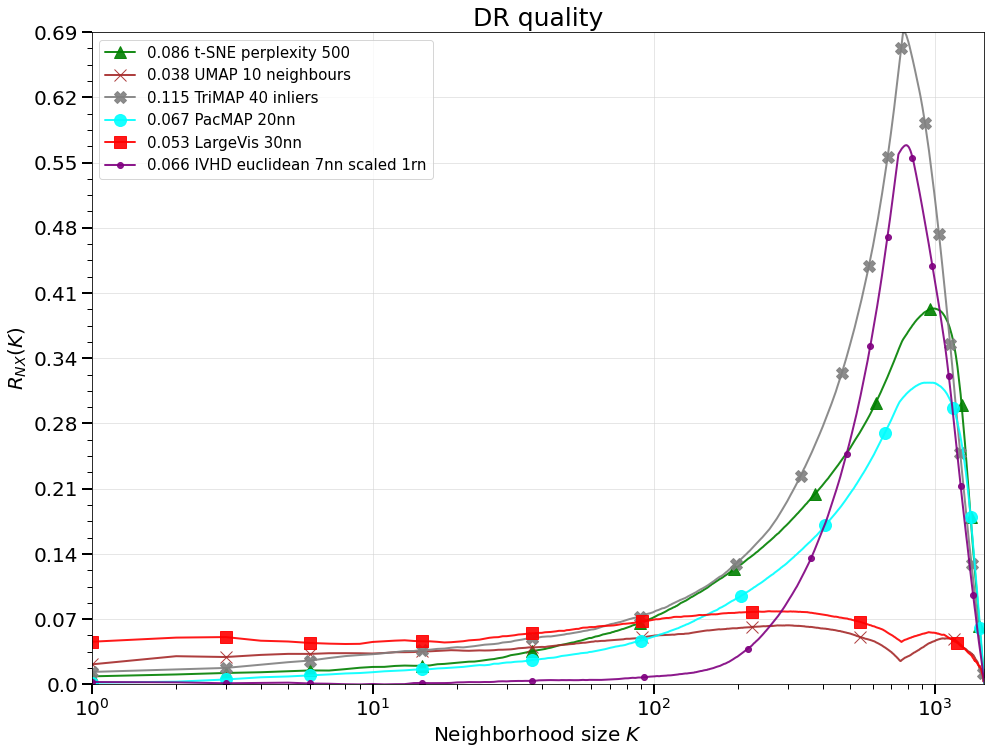

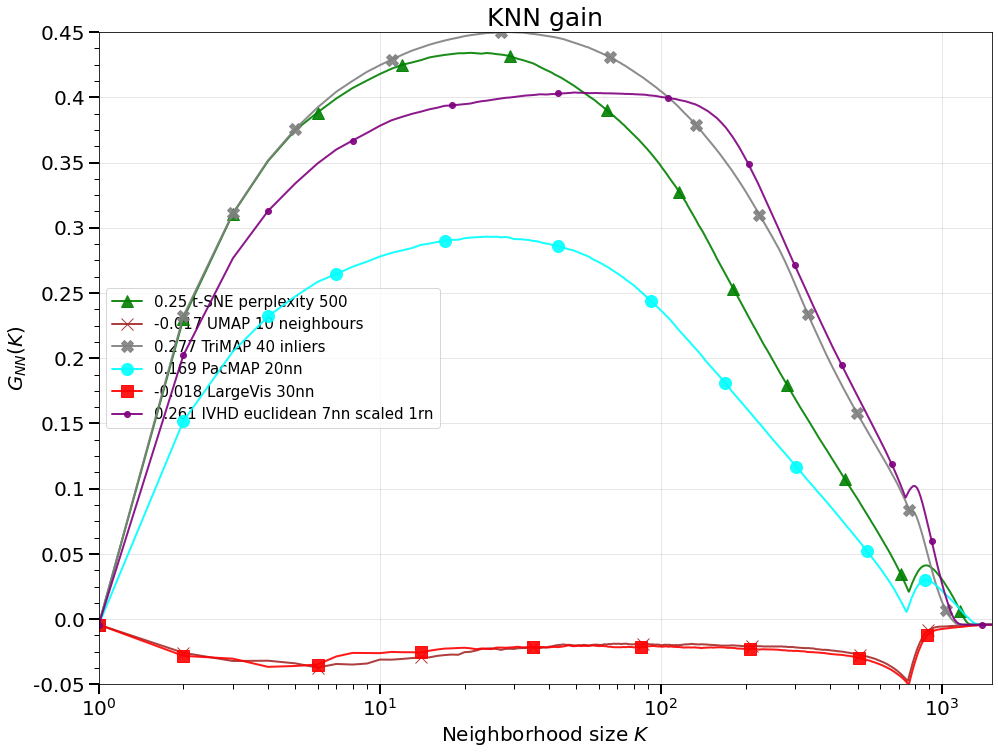

In [32]:
ball_1sphere_best_method_results.visualize()